In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from catboost import CatBoostClassifier

In [31]:
df_train = pd.read_csv("C:/Users/Rehan Ibrahim/OneDrive - HEC Paris/Desktop/Machine Learning 2 Project/Forest-Cover-Prediction/Data/train.csv")
df_train

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,242642,2881,130,22,210,54,1020,250,221,88,...,0,0,0,0,0,0,0,0,0,1
1,309891,3005,351,14,242,-16,1371,194,215,159,...,0,0,0,0,0,0,0,0,0,1
2,287847,3226,63,14,618,2,1092,232,210,107,...,0,0,0,0,0,0,0,0,0,1
3,516307,3298,317,8,661,60,752,198,233,174,...,0,0,0,0,0,0,0,0,0,1
4,124860,3080,35,6,175,26,3705,219,227,144,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,475155,3328,321,13,323,12,5109,186,227,180,...,0,0,0,0,0,0,1,0,0,7
15116,514378,3455,37,5,841,92,939,220,229,146,...,0,0,0,0,0,0,0,0,1,7
15117,368425,3279,90,14,404,113,1513,240,218,105,...,0,0,0,0,0,0,0,0,0,7
15118,537844,3589,357,9,418,52,1868,205,223,155,...,0,0,0,0,0,0,0,0,1,7


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

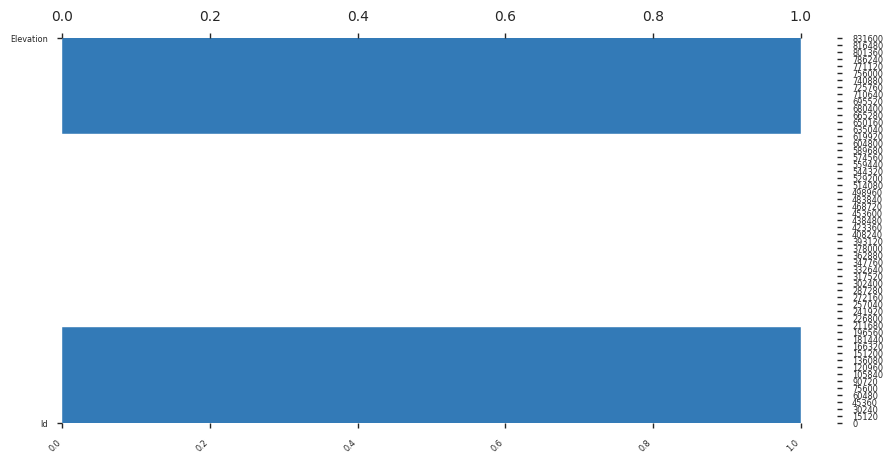

In [3]:
profile = ProfileReport(df_train, title="Pandas Profiling Report")
profile

In [32]:
df_train.dtypes

Id                                    int64
Elevation                             int64
Aspect                                int64
Slope                                 int64
Horizontal_Distance_To_Hydrology      int64
Vertical_Distance_To_Hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Wilderness_Area1                      int64
Wilderness_Area2                      int64
Wilderness_Area3                      int64
Wilderness_Area4                      int64
Soil_Type1                            int64
Soil_Type2                            int64
Soil_Type3                            int64
Soil_Type4                            int64
Soil_Type5                            int64
Soil_Type6                            int64
Soil_Type7                            int64
Soil_Type8                      

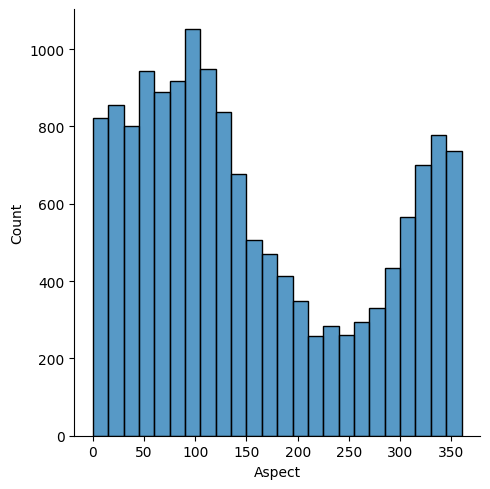

In [33]:
sns.displot(df_train["Aspect"])
plt.show()

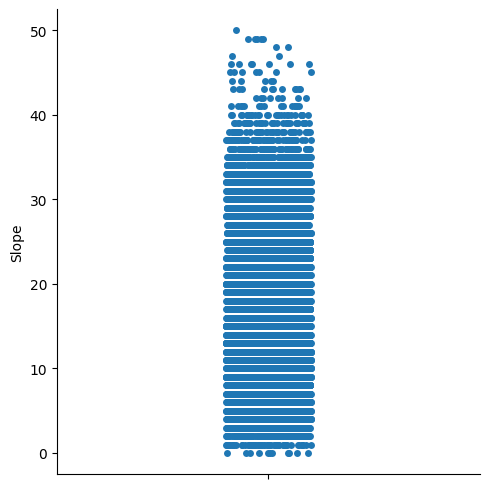

In [34]:
sns.catplot(df_train["Slope"])
plt.show()

In [35]:
df_train.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,...,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,267008.526389,2748.649934,155.834524,16.556746,228.376521,51.311706,1717.977712,213.028836,218.865741,134.477116,...,0.043849,0.040939,0.001190,0.006812,0.000926,0.002116,0.049206,0.041931,0.030159,4.000000
std,179261.722330,419.009589,109.745372,8.534602,209.196381,61.520488,1330.263450,30.638406,22.797288,46.070054,...,0.204766,0.198156,0.034484,0.082257,0.030416,0.045957,0.216306,0.200439,0.171030,2.000066
min,5.000000,1877.000000,0.000000,0.000000,0.000000,-135.000000,0.000000,52.000000,99.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,103705.000000,2373.000000,65.000000,10.000000,67.000000,5.000000,760.000000,197.000000,207.000000,106.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,276034.500000,2754.000000,125.000000,15.000000,180.000000,32.000000,1315.000000,220.000000,223.000000,138.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,398150.250000,3109.000000,257.000000,22.000000,330.000000,80.000000,2292.000000,236.000000,235.000000,166.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,581005.000000,3850.000000,360.000000,50.000000,1376.000000,570.000000,6803.000000,254.000000,254.000000,251.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [36]:
df_train.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,242642,2881,130,22,210,54,1020,250,221,88,...,0,0,0,0,0,0,0,0,0,1
1,309891,3005,351,14,242,-16,1371,194,215,159,...,0,0,0,0,0,0,0,0,0,1
2,287847,3226,63,14,618,2,1092,232,210,107,...,0,0,0,0,0,0,0,0,0,1
3,516307,3298,317,8,661,60,752,198,233,174,...,0,0,0,0,0,0,0,0,0,1
4,124860,3080,35,6,175,26,3705,219,227,144,...,0,0,0,0,0,0,0,0,0,1


In [37]:
X = df_train.drop(["Cover_Type"],axis=1)
y = df_train["Cover_Type"]
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.33, random_state=42)

In [10]:
#X, y = make_classification(n_samples=1000, n_features=4,n_informative=2, n_redundant=0,random_state=0, shuffle=False)
clf = CatBoostClassifier(max_depth=10,n_estimators=700,random_state=0,task_type="GPU")
clf.fit(X_train, y_train)

Learning rate set to 0.140107
0:	learn: 1.6004712	total: 58.4ms	remaining: 40.9s
1:	learn: 1.4068847	total: 102ms	remaining: 35.6s
2:	learn: 1.2734016	total: 150ms	remaining: 34.9s
3:	learn: 1.1694066	total: 195ms	remaining: 34s
4:	learn: 1.0868403	total: 235ms	remaining: 32.6s
5:	learn: 1.0161104	total: 271ms	remaining: 31.4s
6:	learn: 0.9547390	total: 307ms	remaining: 30.4s
7:	learn: 0.9055450	total: 350ms	remaining: 30.3s
8:	learn: 0.8570458	total: 383ms	remaining: 29.4s
9:	learn: 0.8173755	total: 425ms	remaining: 29.3s
10:	learn: 0.7824775	total: 463ms	remaining: 29s
11:	learn: 0.7527745	total: 505ms	remaining: 28.9s
12:	learn: 0.7266882	total: 548ms	remaining: 29s
13:	learn: 0.7054853	total: 590ms	remaining: 28.9s
14:	learn: 0.6818769	total: 631ms	remaining: 28.8s
15:	learn: 0.6612331	total: 666ms	remaining: 28.5s
16:	learn: 0.6417645	total: 706ms	remaining: 28.4s
17:	learn: 0.6235765	total: 742ms	remaining: 28.1s
18:	learn: 0.6069201	total: 783ms	remaining: 28.1s
19:	learn: 0.593

In [29]:
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier

clf = make_pipeline(preprocessing.StandardScaler(), 
                    RandomForestClassifier(bootstrap=False, 
                                           criterion="entropy", 
                                           max_features=0.25, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3, 
                                           n_estimators=500))

clf.fit(X_train,y_train)
print(clf.score(X_test, y_test))

0.895190380761523


In [38]:
X_train.shape

(10130, 55)

In [17]:
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?

x_ntest = pd.read_csv("C:/Users/Rehan Ibrahim/OneDrive - HEC Paris/Desktop/Machine Learning 2 Project/Forest-Cover-Prediction/Data/test-full.csv")
y_pred = clf.predict(x_ntest)
#print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
y_pred

array([5, 5, 2, ..., 3, 3, 3], dtype=int64)

In [18]:
full_submission = pd.read_csv("C:/Users/Rehan Ibrahim/OneDrive - HEC Paris/Desktop/Machine Learning 2 Project/Forest-Cover-Prediction/Data/full_submission.csv")
full_submission.head()

,Id,Cover_Type
0,1,5
1,2,5
2,3,5
3,4,4
4,5,5


In [19]:
full_submission["Cover_Type"] = y_pred

In [20]:
full_submission.head()

,Id,Cover_Type
0,1,5
1,2,5
2,3,2
3,4,2
4,5,5


In [24]:
full_submission.to_csv("Submisssion_3_Rehan.csv",index=False)